# CvT gender prediction

In [1]:
import pandas as pd
import torch

In [2]:
# Load the data
df = pd.read_csv('./faces/fold_0_data.txt', sep="\t")

In [3]:
print(df.shape)
print(df.columns)
df.head()

(4484, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [4]:
# Load the other dataframes
df1 = pd.read_csv('./faces/fold_1_data.txt', sep="\t")
df2 = pd.read_csv('./faces/fold_2_data.txt', sep="\t")
df3 = pd.read_csv('./faces/fold_3_data.txt', sep="\t")
df4 = pd.read_csv('./faces/fold_4_data.txt', sep="\t")

# Concatenate all the dataframes
df = pd.concat([df, df1, df2, df3, df4]).reset_index(drop=True)

In [5]:
print(df.shape)
print(df.columns)
df.head()

(19370, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [6]:
# Create a new column with the path to the images
df['path'] = df['user_id'] + '/' + "coarse_tilt_aligned_face." + df['face_id'].astype(str) + "." + df['original_image']
df['path'].head()

0    30601258@N03/coarse_tilt_aligned_face.1.103996...
1    30601258@N03/coarse_tilt_aligned_face.2.104248...
2    30601258@N03/coarse_tilt_aligned_face.1.104379...
3    30601258@N03/coarse_tilt_aligned_face.3.104379...
4    30601258@N03/coarse_tilt_aligned_face.2.118166...
Name: path, dtype: object

In [7]:
# drop duplicate images
df = df.drop_duplicates(subset=['path'], keep='first').reset_index(drop=True)

In [8]:
df.shape

(19370, 13)

In [9]:
df['gender'].value_counts()

gender
f    9372
m    8120
u    1099
Name: count, dtype: int64

In [10]:
# drop the rows with u or nan for gender
df = df[(df['gender'] != 'u') & (df['gender'].notnull())]
df['gender'].value_counts()

gender
f    9372
m    8120
Name: count, dtype: int64

In [11]:
# encode gender column as male
df['male'] = df['gender'].apply(lambda x: 1 if x == 'm' else 0)
df['male'].value_counts()

male
0    9372
1    8120
Name: count, dtype: int64

In [ ]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from PIL import Image


dim = 224 # image size


# Define the dataset class
class ImageDataset(Dataset):
  def __init__(self, annotations_df, img_dir, dim=dim, transform=None, target_transform=None):
    self.annotations_df = annotations_df
    self.img_dir = img_dir
    self.dim = dim
    self.transform = transform
    self.target_transform = target_transform

  def __len__(self):
    return len(self.annotations_df)

  def __getitem__(self, idx):
    img_path = os.path.join(self.img_dir, self.annotations_df.loc[idx, 'path'])
    # read the image and resize
    image = Image.open(img_path).convert("RGB")
    image = image.resize((self.dim, self.dim))
    # convert to tensor
    image = ToTensor()(image)
    label = self.annotations_df.loc[idx, 'male']
    label = torch.tensor(label)
    if self.transform: # apply any transformations (for data augmentation on train set)
        image = self.transform(image, self.dim)
    if self.target_transform:
        label = self.target_transform(label)
    return image, label

In [ ]:
from torchvision import transforms

def transform_image(image, dim):
  # data augmentation for training
  # random horizontal flip, rotation, crop and color jitter
  transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(dim, scale=(0.8, 1.0), ratio=(1.0,1.0)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
  ])
  return transform(image)

## 10000 datapoints: 8000 Train, 1000 Val, 1000 Test

In [14]:
# sample 10000 images, with an equal number of each gender
df_male = df[df['gender'] == 'm'].sample(n=5000, random_state=23)
df_female = df[df['gender'] == 'f'].sample(n=5000, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    5000
f    5000
Name: count, dtype: int64


In [15]:
# Get train, validation and test sets (80-10-10)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df_sampled, test_size=0.2, random_state=23)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [16]:
len(train_dataset), len(val_dataset), len(test_dataset)

(8000, 1000, 1000)

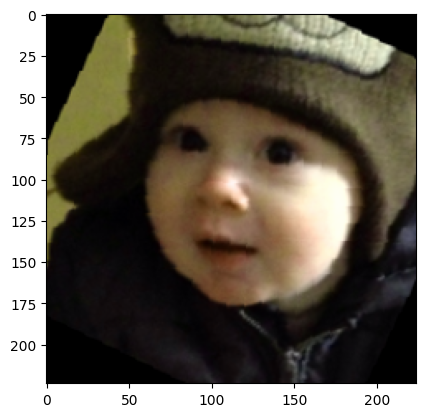

In [17]:
# show an image
image, label = train_dataset[1]
plt.imshow(image.permute(1, 2, 0))
plt.show()

In [18]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Define the labels and their mapping
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [21]:
from transformers import CvtConfig, CvtForImageClassification

# Initializing a configuration for CvT microsoft/cvt-13 architecture
config = CvtConfig(num_labels=2)

# Initializing a model (with random weights) from the cvt-13 configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification(config).to(device)

config

CvtConfig {
  "_attn_implementation_autoset": true,
  "attention_drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "cls_token": [
    false,
    false,
    true
  ],
  "depth": [
    1,
    2,
    10
  ],
  "drop_path_rate": [
    0.0,
    0.0,
    0.1
  ],
  "drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "embed_dim": [
    64,
    192,
    384
  ],
  "initializer_range": 0.02,
  "kernel_qkv": [
    3,
    3,
    3
  ],
  "layer_norm_eps": 1e-12,
  "mlp_ratio": [
    4.0,
    4.0,
    4.0
  ],
  "model_type": "cvt",
  "num_channels": 3,
  "num_heads": [
    1,
    3,
    6
  ],
  "padding_kv": [
    1,
    1,
    1
  ],
  "padding_q": [
    1,
    1,
    1
  ],
  "patch_padding": [
    2,
    1,
    1
  ],
  "patch_sizes": [
    7,
    3,
    3
  ],
  "patch_stride": [
    4,
    2,
    2
  ],
  "qkv_bias": [
    true,
    true,
    true
  ],
  "qkv_projection_method": [
    "dw_bn",
    "dw_bn",
    "dw_bn"
  ],
  "stride_kv": [
    2,
    2,
    2
  ],
  "stride_q": [
    1,
    1,
   

In [22]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [23]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [24]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [25]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.7134, Training Accuracy: 0.5356
Validation Loss: 0.6624, Validation Accuracy: 0.5980
===== Epoch 2 =====
Training Loss: 0.6653, Training Accuracy: 0.5924
Validation Loss: 0.6305, Validation Accuracy: 0.6560
===== Epoch 3 =====
Training Loss: 0.6417, Training Accuracy: 0.6149
Validation Loss: 0.6054, Validation Accuracy: 0.6570
===== Epoch 4 =====
Training Loss: 0.6128, Training Accuracy: 0.6491
Validation Loss: 0.5607, Validation Accuracy: 0.6970
===== Epoch 5 =====
Training Loss: 0.6024, Training Accuracy: 0.6601
Validation Loss: 0.5587, Validation Accuracy: 0.7110
===== Epoch 6 =====
Training Loss: 0.5878, Training Accuracy: 0.6666
Validation Loss: 0.5239, Validation Accuracy: 0.7260
===== Epoch 7 =====
Training Loss: 0.5665, Training Accuracy: 0.6835
Validation Loss: 0.5075, Validation Accuracy: 0.7440
===== Epoch 8 =====
Training Loss: 0.5662, Training Accuracy: 0.6793
Validation Loss: 0.4969, Validation Accuracy: 0.7460
===== Epoch 9 =====
Trai

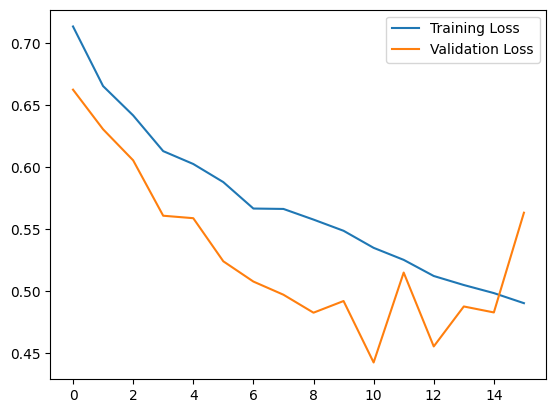

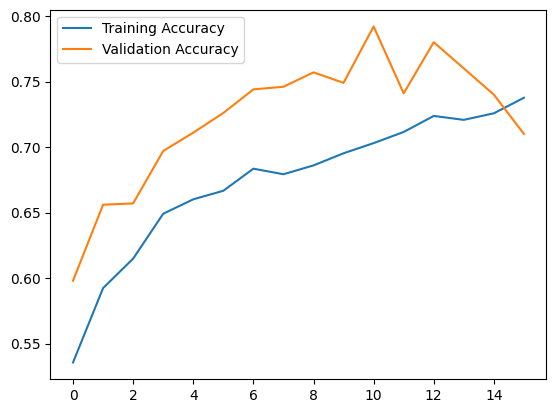

In [25]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_19220\2262251525.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13.pth'))



Accuracy: 0.7990

F1-Score: 0.7990

Precision: 0.7990

Recall: 0.7990


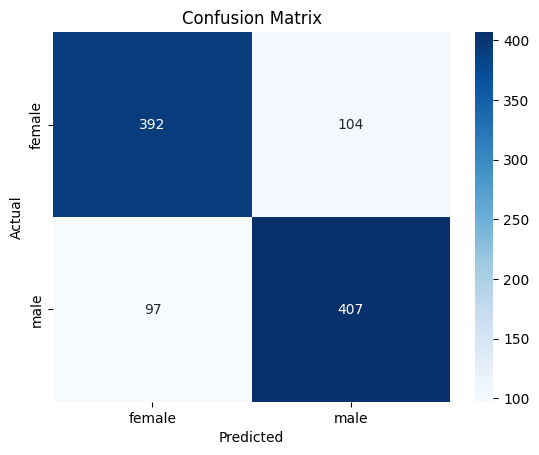

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13.pth'))
cvt_13.to(device)

cvt_13.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

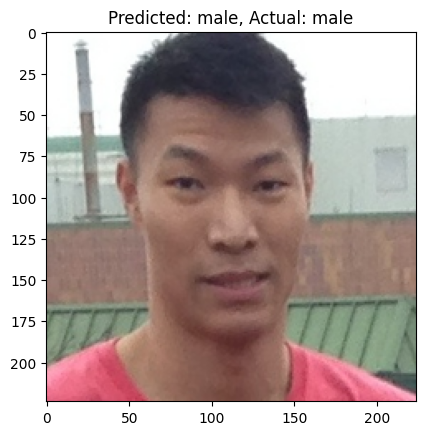

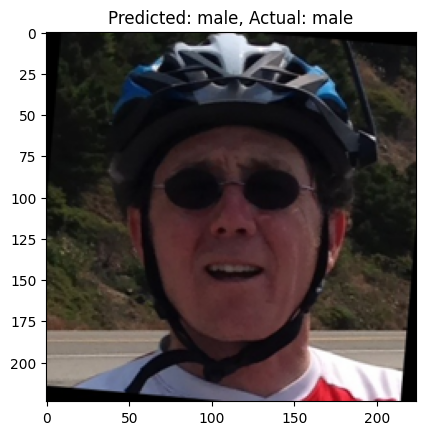

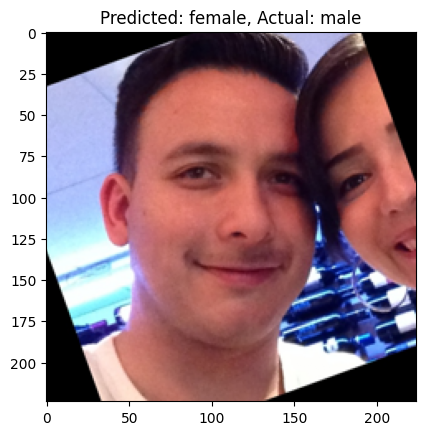

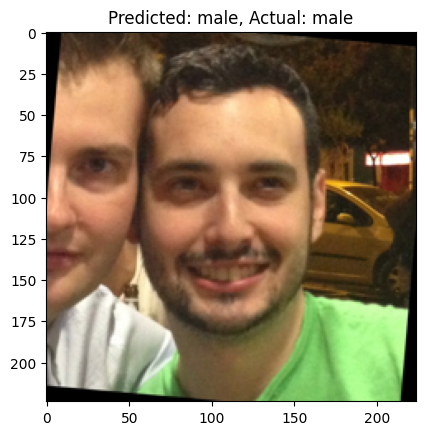

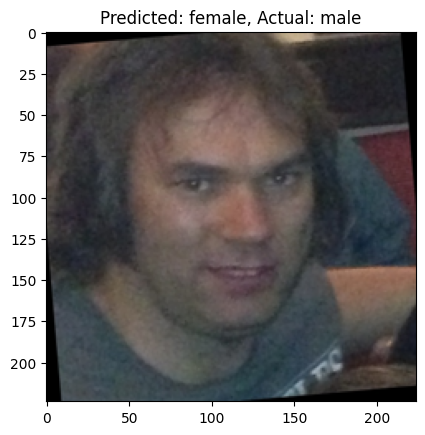

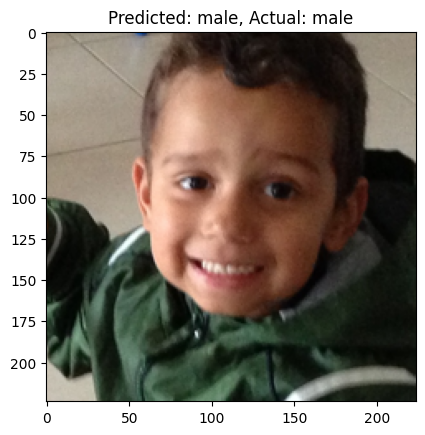

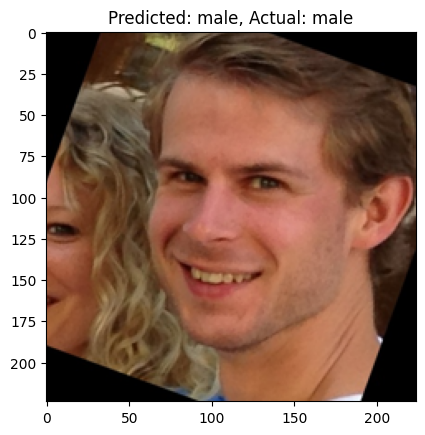

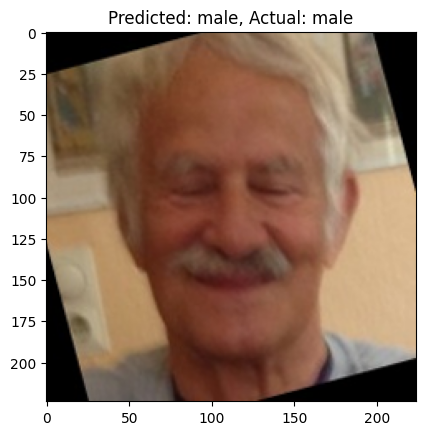

In [31]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from transformers import CvtForImageClassification

# Load the pretrained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification.from_pretrained("microsoft/cvt-13")
# Change the classifier to output 2 classes
cvt_13.classifier = torch.nn.Linear(cvt_13.classifier.in_features, 2)
cvt_13.to(device)

c:\Work\python_venv\ML_AI_venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Work\python_venv\ML_AI_venv\Lib\site-packages\huggingface_hub\file_download.py:144: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\waiho\.cache\huggingface\hub\models--microsoft--cvt-13. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [21]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [22]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [23]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    # backpropagation
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_finetune.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.4139, Training Accuracy: 0.7759
Validation Loss: 0.1767, Validation Accuracy: 0.9190
===== Epoch 2 =====
Training Loss: 0.3009, Training Accuracy: 0.8306
Validation Loss: 0.1445, Validation Accuracy: 0.9430
===== Epoch 3 =====
Training Loss: 0.2553, Training Accuracy: 0.8526
Validation Loss: 0.1593, Validation Accuracy: 0.9380
===== Epoch 4 =====
Training Loss: 0.2335, Training Accuracy: 0.8589
Validation Loss: 0.1196, Validation Accuracy: 0.9500
===== Epoch 5 =====
Training Loss: 0.2094, Training Accuracy: 0.8710
Validation Loss: 0.1358, Validation Accuracy: 0.9500
===== Epoch 6 =====
Training Loss: 0.2077, Training Accuracy: 0.8640
Validation Loss: 0.1033, Validation Accuracy: 0.9620
===== Epoch 7 =====
Training Loss: 0.1939, Training Accuracy: 0.8755
Validation Loss: 0.1018, Validation Accuracy: 0.9620
===== Epoch 8 =====
Training Loss: 0.1830, Training Accuracy: 0.8811
Validation Loss: 0.1321, Validation Accuracy: 0.9580
===== Epoch 9 =====
Trai

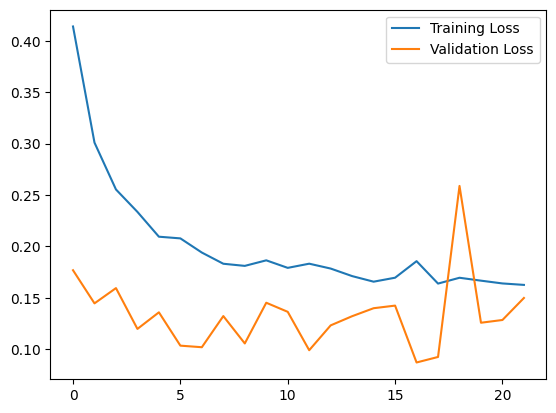

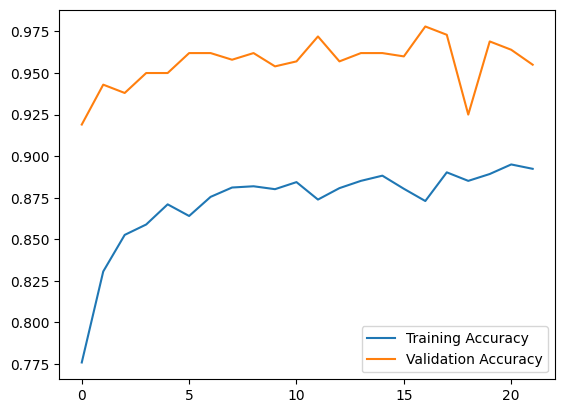

In [27]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9670

F1-Score: 0.9670

Precision: 0.9672

Recall: 0.9670


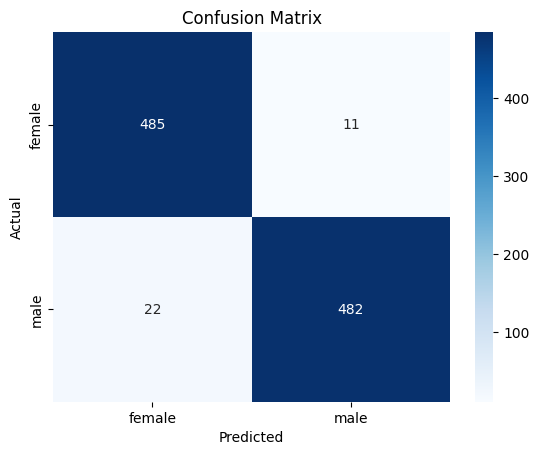

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_finetune.pth'))
cvt_13.to(device)

cvt_13.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

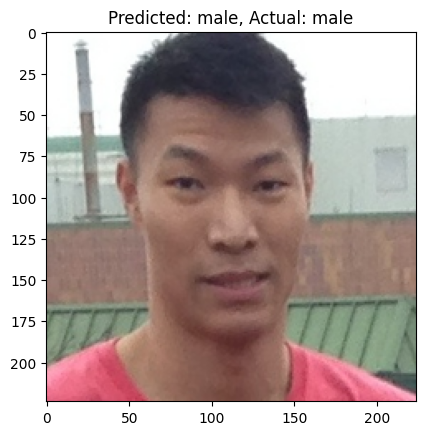

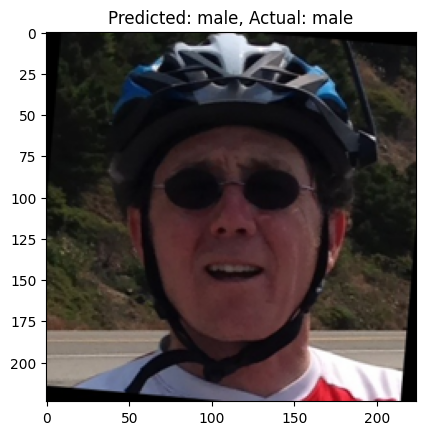

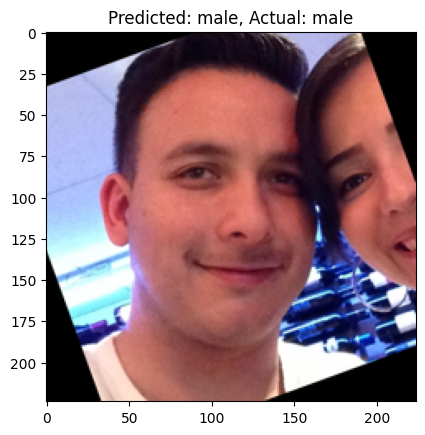

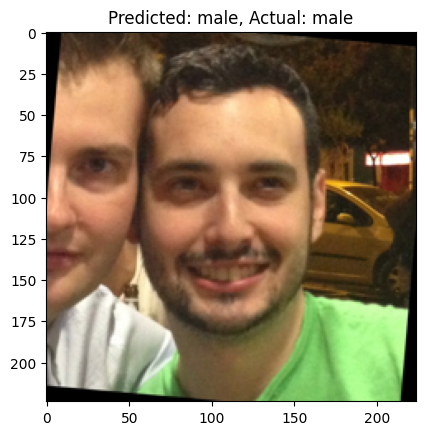

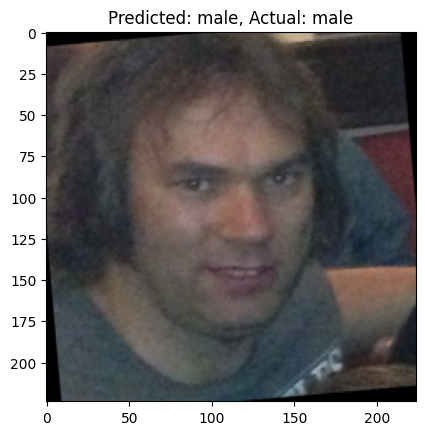

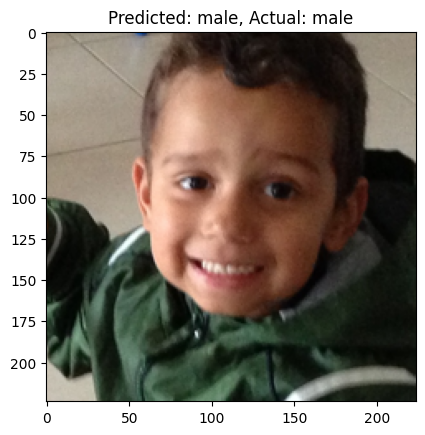

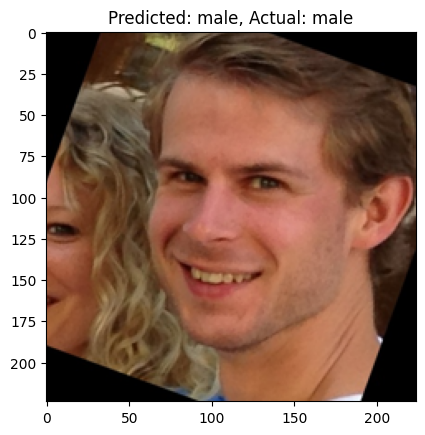

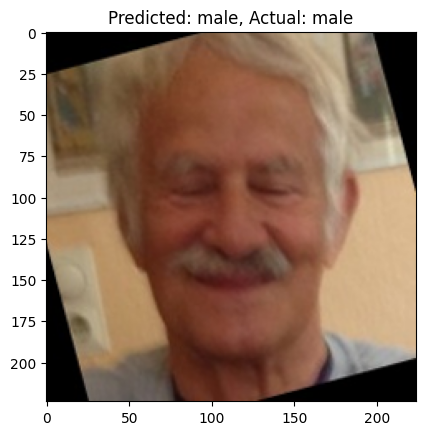

In [31]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## Less Training Data (4000 Train, 500 Val, Same 1000 Test data)

In [20]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 4500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=2250, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=2250, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    2250
f    2250
Name: count, dtype: int64


In [21]:
# Get train and validation sets (4000-500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [22]:
len(train_dataset), len(val_dataset), len(test_dataset)

(4000, 500, 1000)

In [23]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [24]:
from transformers import CvtConfig, CvtForImageClassification

# Initializing a configuration for CvT microsoft/cvt-13 architecture
config = CvtConfig(num_labels=2)

# Initializing a model (with random weights) from the cvt-13 configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification(config).to(device)

config

CvtConfig {
  "_attn_implementation_autoset": true,
  "attention_drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "cls_token": [
    false,
    false,
    true
  ],
  "depth": [
    1,
    2,
    10
  ],
  "drop_path_rate": [
    0.0,
    0.0,
    0.1
  ],
  "drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "embed_dim": [
    64,
    192,
    384
  ],
  "initializer_range": 0.02,
  "kernel_qkv": [
    3,
    3,
    3
  ],
  "layer_norm_eps": 1e-12,
  "mlp_ratio": [
    4.0,
    4.0,
    4.0
  ],
  "model_type": "cvt",
  "num_channels": 3,
  "num_heads": [
    1,
    3,
    6
  ],
  "padding_kv": [
    1,
    1,
    1
  ],
  "padding_q": [
    1,
    1,
    1
  ],
  "patch_padding": [
    2,
    1,
    1
  ],
  "patch_sizes": [
    7,
    3,
    3
  ],
  "patch_stride": [
    4,
    2,
    2
  ],
  "qkv_bias": [
    true,
    true,
    true
  ],
  "qkv_projection_method": [
    "dw_bn",
    "dw_bn",
    "dw_bn"
  ],
  "stride_kv": [
    2,
    2,
    2
  ],
  "stride_q": [
    1,
    1,
   

In [25]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [26]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [27]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [28]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    # backpropagation
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.7229, Training Accuracy: 0.5192
Validation Loss: 0.6884, Validation Accuracy: 0.5580
===== Epoch 2 =====
Training Loss: 0.6853, Training Accuracy: 0.5645
Validation Loss: 0.6426, Validation Accuracy: 0.6140
===== Epoch 3 =====
Training Loss: 0.6756, Training Accuracy: 0.5705
Validation Loss: 0.6489, Validation Accuracy: 0.6420
===== Epoch 4 =====
Training Loss: 0.6729, Training Accuracy: 0.5930
Validation Loss: 0.6452, Validation Accuracy: 0.6100
===== Epoch 5 =====
Training Loss: 0.6839, Training Accuracy: 0.5567
Validation Loss: 0.6648, Validation Accuracy: 0.5920
===== Epoch 6 =====
Training Loss: 0.6582, Training Accuracy: 0.5995
Validation Loss: 0.6352, Validation Accuracy: 0.6300
===== Epoch 7 =====
Training Loss: 0.6449, Training Accuracy: 0.6160
Validation Loss: 0.6186, Validation Accuracy: 0.6400
===== Epoch 8 =====
Training Loss: 0.6339, Training Accuracy: 0.6245
Validation Loss: 0.6116, Validation Accuracy: 0.6400
===== Epoch 9 =====
Trai

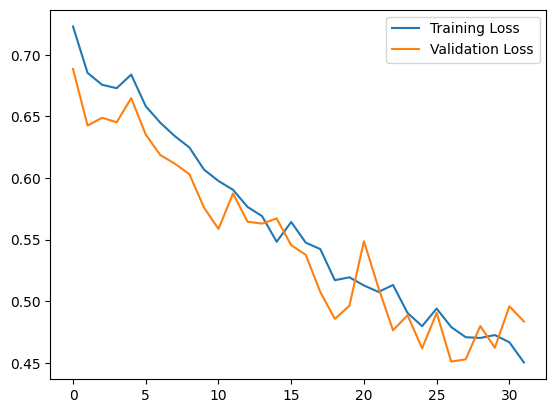

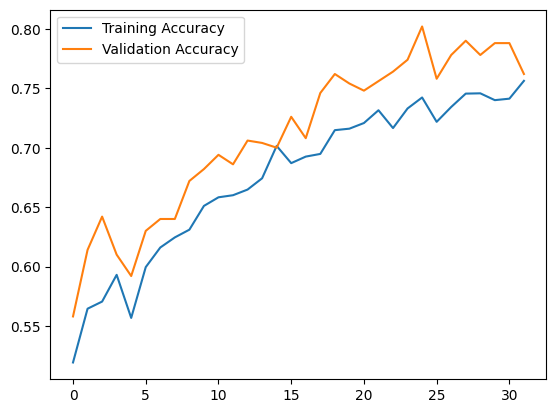

In [34]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_18760\1924982129.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_s_data.pth'))



Accuracy: 0.7960

F1-Score: 0.7960

Precision: 0.7961

Recall: 0.7960


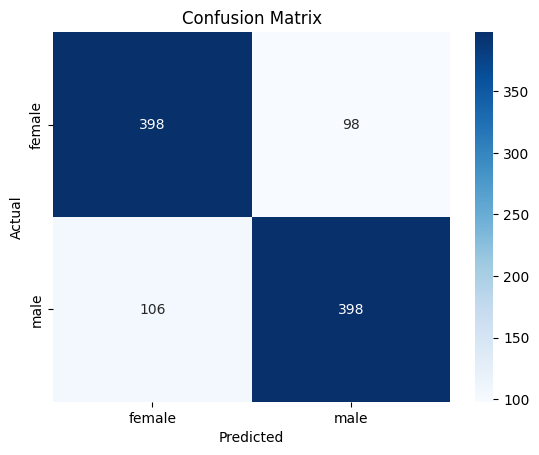

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_s_data.pth'))
cvt_13.to(device)

cvt_13.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

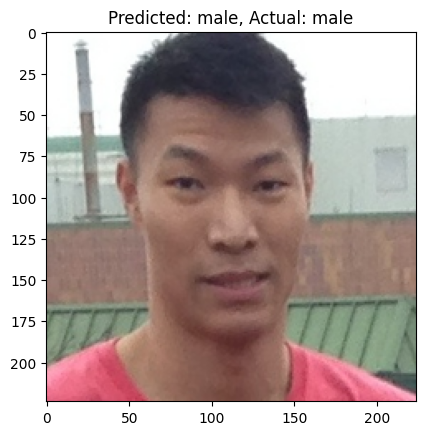

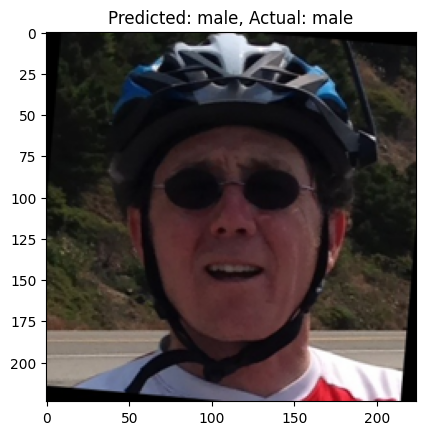

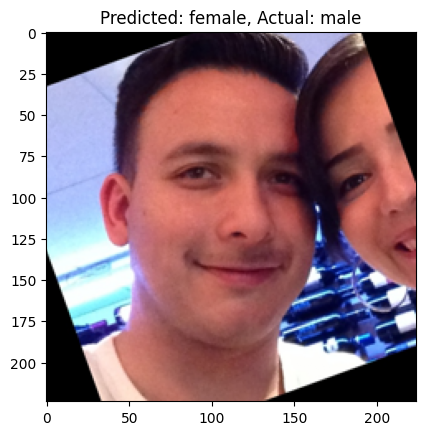

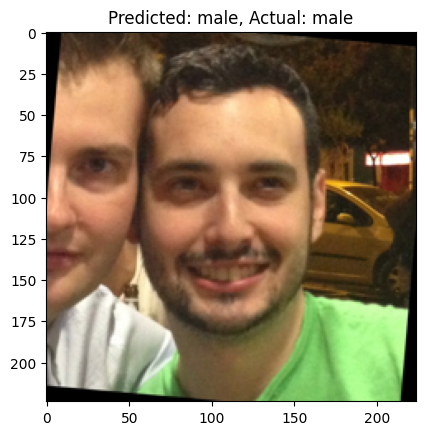

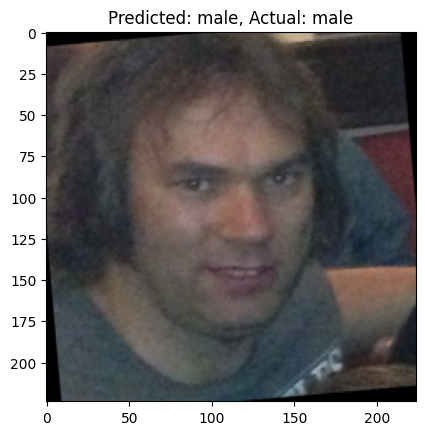

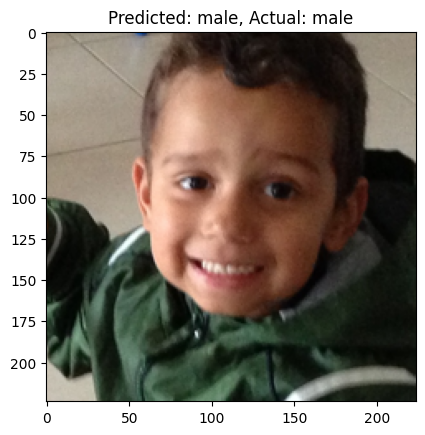

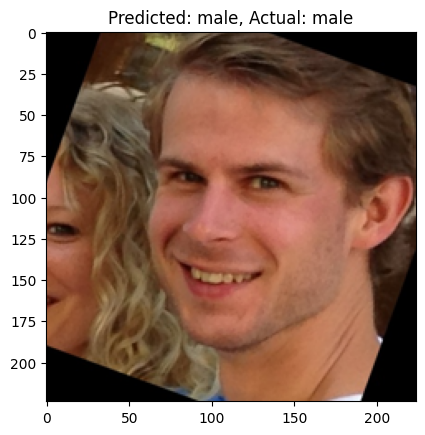

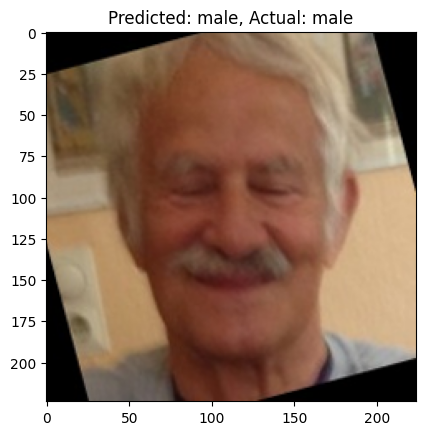

In [36]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from transformers import CvtForImageClassification

# Load the pretrained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification.from_pretrained("microsoft/cvt-13")
# Change the classifier to output 2 classes
cvt_13.classifier = torch.nn.Linear(cvt_13.classifier.in_features, 2)
cvt_13.to(device)

c:\Work\python_venv\ML_AI_venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [25]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [26]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [27]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_finetune_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.4733, Training Accuracy: 0.7412
Validation Loss: 0.2458, Validation Accuracy: 0.9020
===== Epoch 2 =====
Training Loss: 0.3426, Training Accuracy: 0.8117
Validation Loss: 0.1896, Validation Accuracy: 0.9200
===== Epoch 3 =====
Training Loss: 0.2887, Training Accuracy: 0.8363
Validation Loss: 0.2014, Validation Accuracy: 0.9260
===== Epoch 4 =====
Training Loss: 0.2485, Training Accuracy: 0.8575
Validation Loss: 0.1620, Validation Accuracy: 0.9460
===== Epoch 5 =====
Training Loss: 0.2370, Training Accuracy: 0.8650
Validation Loss: 0.2327, Validation Accuracy: 0.9240
===== Epoch 6 =====
Training Loss: 0.2140, Training Accuracy: 0.8668
Validation Loss: 0.2353, Validation Accuracy: 0.9100
===== Epoch 7 =====
Training Loss: 0.2056, Training Accuracy: 0.8765
Validation Loss: 0.1649, Validation Accuracy: 0.9460
===== Epoch 8 =====
Training Loss: 0.2070, Training Accuracy: 0.8638
Validation Loss: 0.1914, Validation Accuracy: 0.9400
===== Epoch 9 =====
Trai

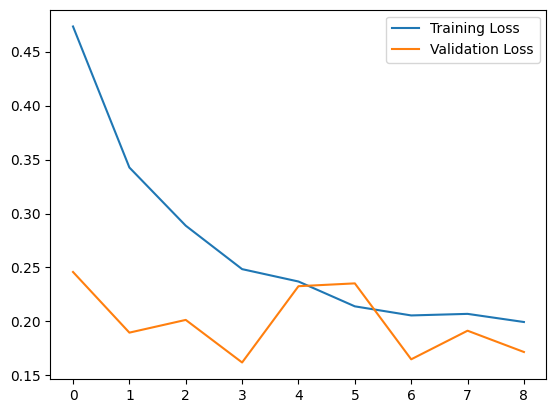

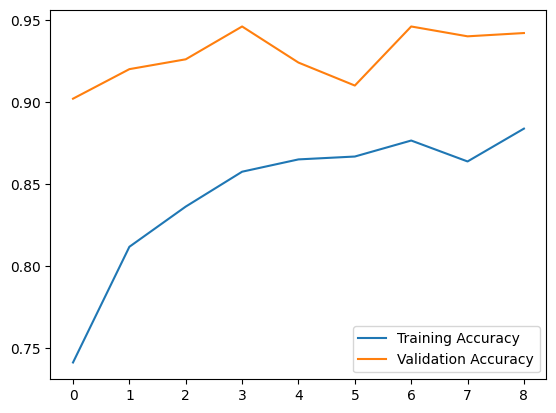

In [30]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9310

F1-Score: 0.9309

Precision: 0.9332

Recall: 0.9310


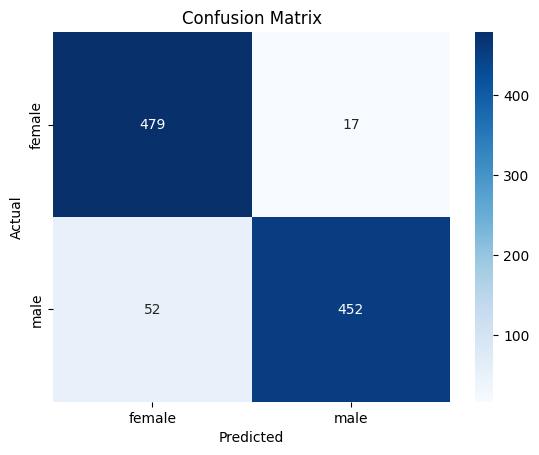

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_finetune_s_data.pth'))
cvt_13.to(device)

cvt_13.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

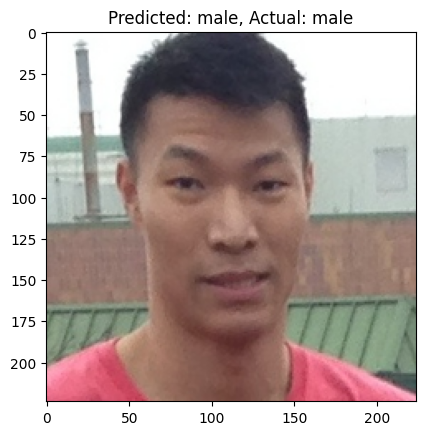

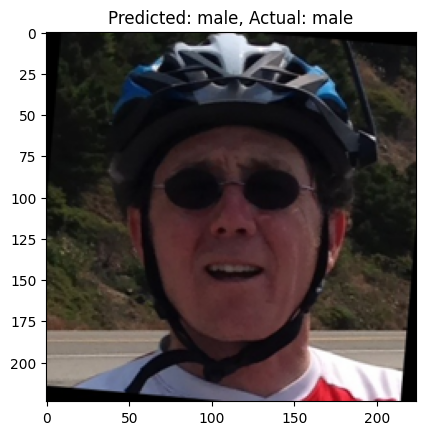

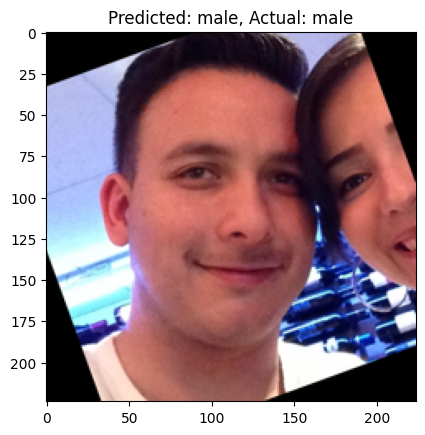

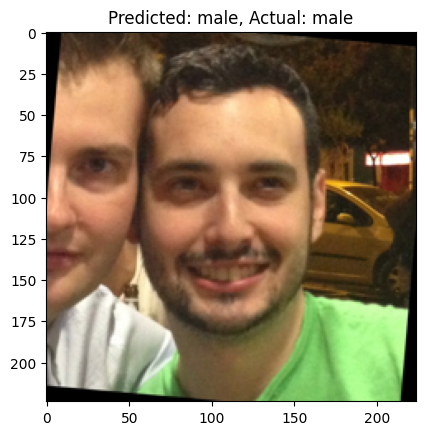

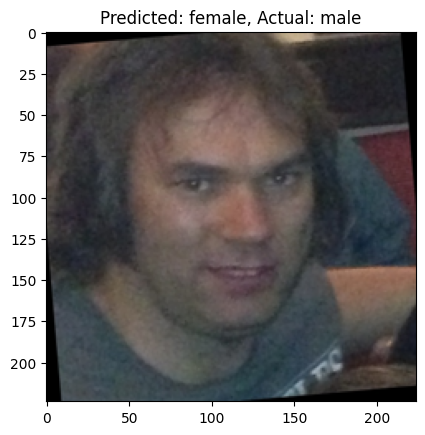

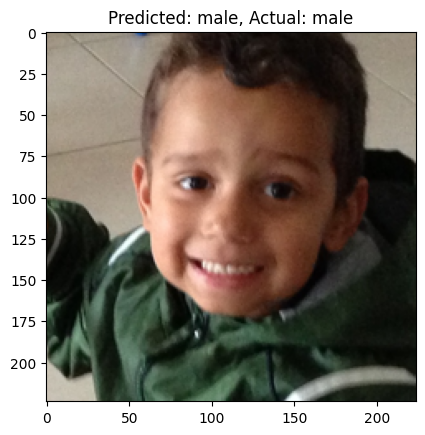

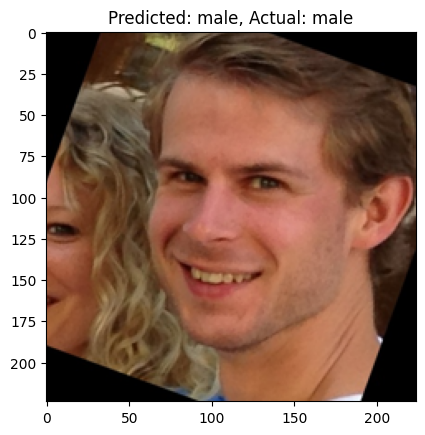

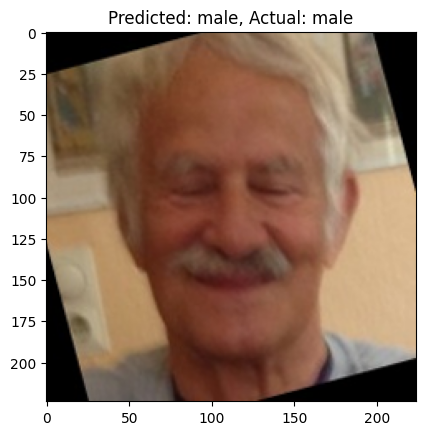

In [32]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## More Training Data (12000 Train, 1500 Val, Same 1000 Test data)

In [20]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 13500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=6750, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=6750, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    6750
f    6750
Name: count, dtype: int64


In [21]:
# Get train and validation sets (12000-1500)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=1500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [22]:
len(train_dataset), len(val_dataset), len(test_dataset)

(12000, 1500, 1000)

In [23]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### Train from scratch

In [24]:
from transformers import CvtConfig, CvtForImageClassification

# Initializing a configuration for CvT microsoft/cvt-13 architecture
config = CvtConfig(num_labels=2)

# Initializing a model (with random weights) from the cvt-13 configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification(config).to(device)

config

CvtConfig {
  "_attn_implementation_autoset": true,
  "attention_drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "cls_token": [
    false,
    false,
    true
  ],
  "depth": [
    1,
    2,
    10
  ],
  "drop_path_rate": [
    0.0,
    0.0,
    0.1
  ],
  "drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "embed_dim": [
    64,
    192,
    384
  ],
  "initializer_range": 0.02,
  "kernel_qkv": [
    3,
    3,
    3
  ],
  "layer_norm_eps": 1e-12,
  "mlp_ratio": [
    4.0,
    4.0,
    4.0
  ],
  "model_type": "cvt",
  "num_channels": 3,
  "num_heads": [
    1,
    3,
    6
  ],
  "padding_kv": [
    1,
    1,
    1
  ],
  "padding_q": [
    1,
    1,
    1
  ],
  "patch_padding": [
    2,
    1,
    1
  ],
  "patch_sizes": [
    7,
    3,
    3
  ],
  "patch_stride": [
    4,
    2,
    2
  ],
  "qkv_bias": [
    true,
    true,
    true
  ],
  "qkv_projection_method": [
    "dw_bn",
    "dw_bn",
    "dw_bn"
  ],
  "stride_kv": [
    2,
    2,
    2
  ],
  "stride_q": [
    1,
    1,
   

In [25]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [26]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [27]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [28]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.6916, Training Accuracy: 0.5588
Validation Loss: 0.6295, Validation Accuracy: 0.6547
===== Epoch 2 =====
Training Loss: 0.6345, Training Accuracy: 0.6304
Validation Loss: 0.6109, Validation Accuracy: 0.6593
===== Epoch 3 =====
Training Loss: 0.6076, Training Accuracy: 0.6458
Validation Loss: 0.6001, Validation Accuracy: 0.6793
===== Epoch 4 =====
Training Loss: 0.5811, Training Accuracy: 0.6762
Validation Loss: 0.5197, Validation Accuracy: 0.7380
===== Epoch 5 =====
Training Loss: 0.5656, Training Accuracy: 0.6817
Validation Loss: 0.5209, Validation Accuracy: 0.7367
===== Epoch 6 =====
Training Loss: 0.5455, Training Accuracy: 0.6983
Validation Loss: 0.5192, Validation Accuracy: 0.7293
===== Epoch 7 =====
Training Loss: 0.5342, Training Accuracy: 0.7016
Validation Loss: 0.4820, Validation Accuracy: 0.7607
===== Epoch 8 =====
Training Loss: 0.5224, Training Accuracy: 0.7133
Validation Loss: 0.4599, Validation Accuracy: 0.7840
===== Epoch 9 =====
Trai

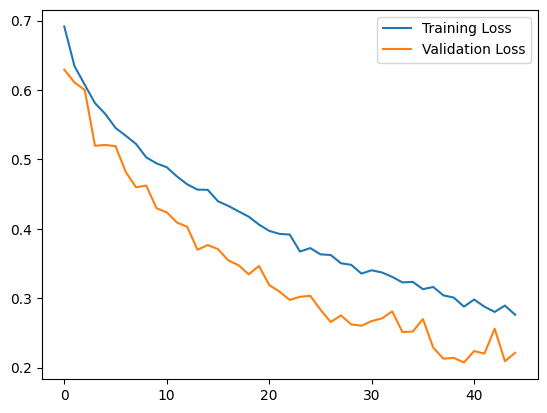

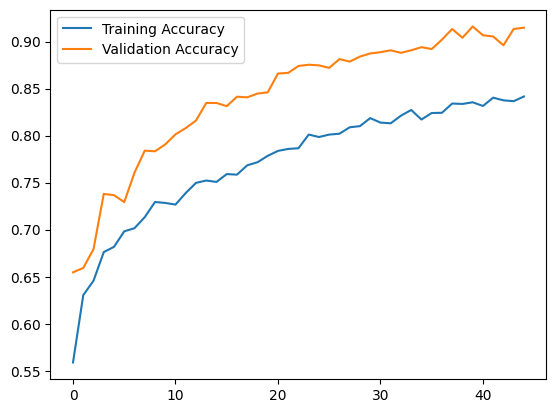

In [32]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

C:\Users\waiho\AppData\Local\Temp\ipykernel_2036\4080151933.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_l_data.pth'))



Accuracy: 0.8990

F1-Score: 0.8990

Precision: 0.8990

Recall: 0.8990


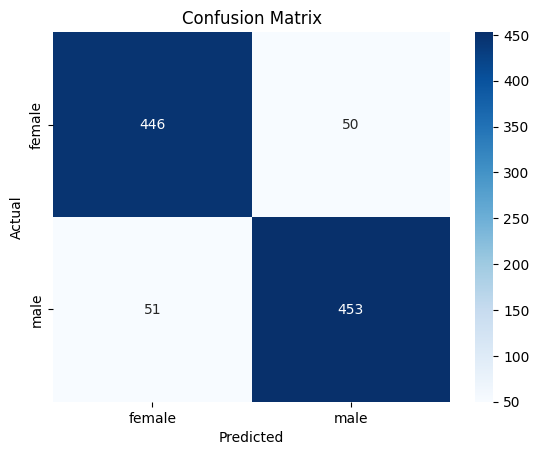

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_l_data.pth'))
cvt_13.to(device)

cvt_13.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

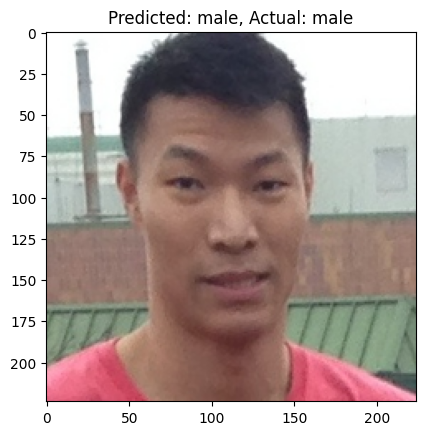

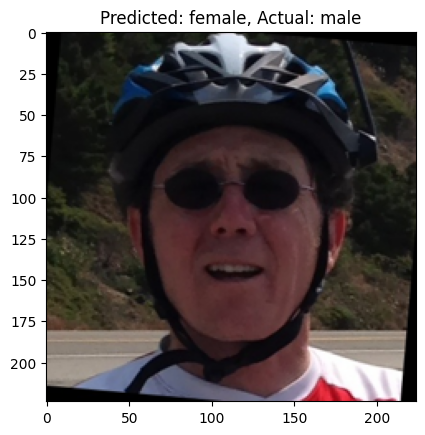

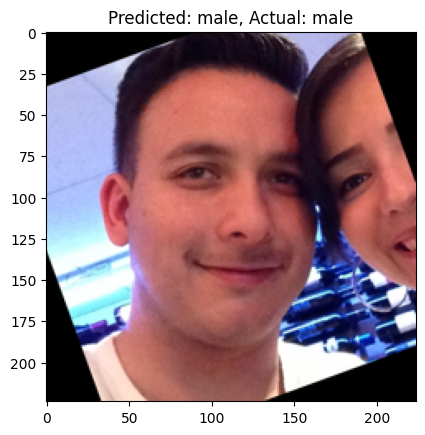

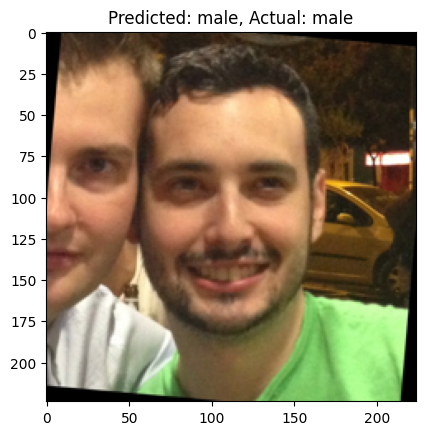

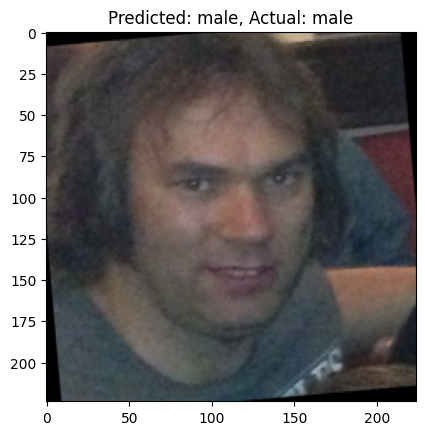

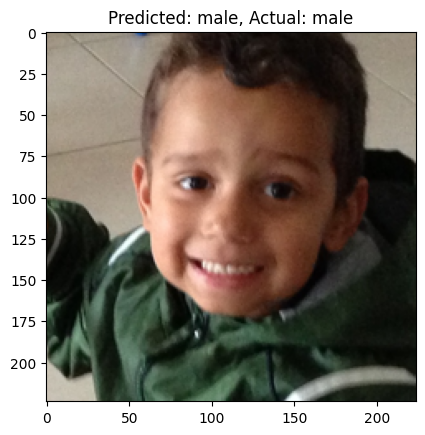

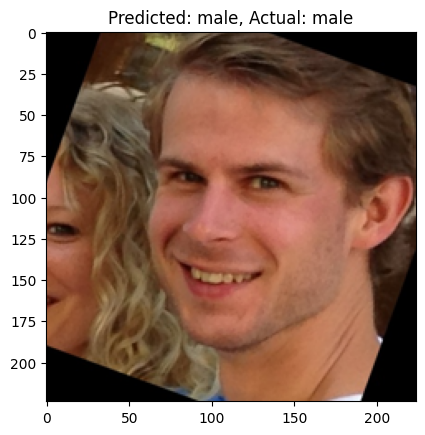

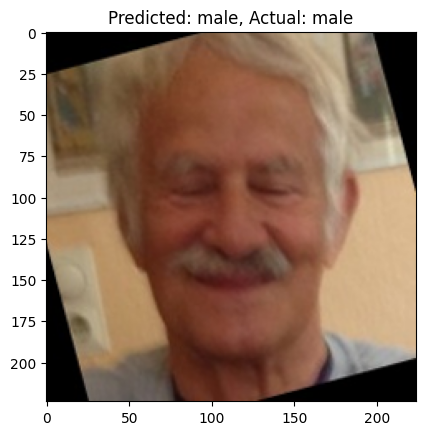

In [34]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from transformers import CvtForImageClassification

# Load the pretrained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification.from_pretrained("microsoft/cvt-13")
# Change the classifier to output 2 classes
cvt_13.classifier = torch.nn.Linear(cvt_13.classifier.in_features, 2)
cvt_13.to(device)

c:\Work\python_venv\ML_AI_venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [25]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [26]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [27]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  # Early stopping function to be called after each epoch
  # if the loss has not improved above the threshold (min_delta) for patience epochs, stop training
  # if the loss has improved, reset the counter
  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [ ]:
# Train the model
n_epochs = 100

# Lists to store the losses and accuracies for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    # backpropagation
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_finetune_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

===== Epoch 1 =====
Training Loss: 0.3854, Training Accuracy: 0.7881
Validation Loss: 0.1329, Validation Accuracy: 0.9507
===== Epoch 2 =====
Training Loss: 0.2722, Training Accuracy: 0.8458
Validation Loss: 0.1234, Validation Accuracy: 0.9533
===== Epoch 3 =====
Training Loss: 0.2485, Training Accuracy: 0.8591
Validation Loss: 0.1404, Validation Accuracy: 0.9440
===== Epoch 4 =====
Training Loss: 0.2215, Training Accuracy: 0.8668
Validation Loss: 0.0951, Validation Accuracy: 0.9640
===== Epoch 5 =====
Training Loss: 0.2053, Training Accuracy: 0.8734
Validation Loss: 0.0661, Validation Accuracy: 0.9733
===== Epoch 6 =====
Training Loss: 0.1998, Training Accuracy: 0.8722
Validation Loss: 0.0836, Validation Accuracy: 0.9660
===== Epoch 7 =====
Training Loss: 0.1905, Training Accuracy: 0.8809
Validation Loss: 0.2295, Validation Accuracy: 0.9273
===== Epoch 8 =====
Training Loss: 0.1897, Training Accuracy: 0.8798
Validation Loss: 0.0745, Validation Accuracy: 0.9713
===== Epoch 9 =====
Trai

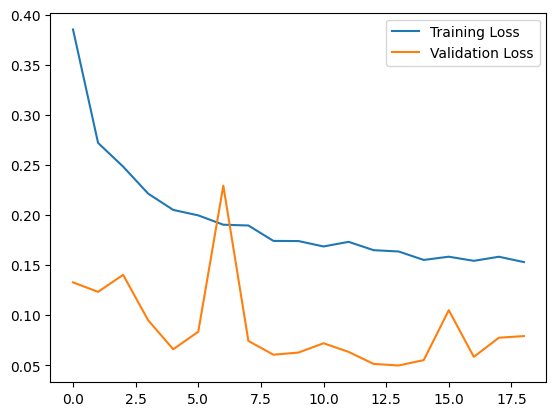

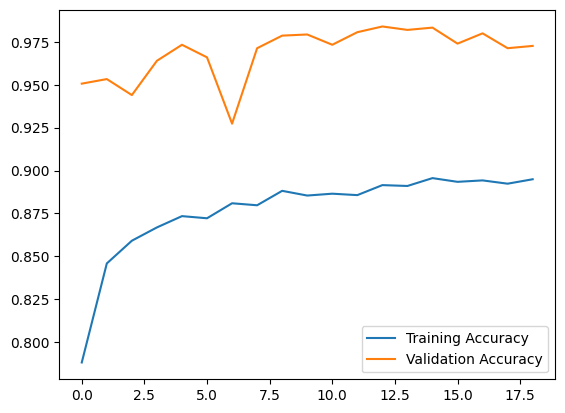

In [30]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()


Accuracy: 0.9720

F1-Score: 0.9720

Precision: 0.9720

Recall: 0.9720


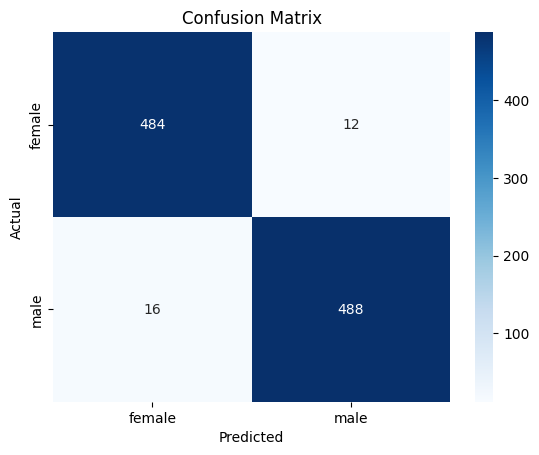

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns

# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_finetune_l_data.pth'))
cvt_13.to(device)

cvt_13.eval()
all_labels = []
all_predictions = []

# Iterate over the test set and make predictions
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    predicted = outputs.argmax(1)

    all_labels.extend(labels.cpu().numpy())
    all_predictions.extend(predicted.cpu().numpy())

# Calculate confusion matrix 
cm = confusion_matrix(all_labels, all_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(label2id.keys()), yticklabels=list(label2id.keys()))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Calculate Accuracy, F1-score, Precision, and Recall
accuracy = accuracy_score(all_labels, all_predictions)
f1 = f1_score(all_labels, all_predictions, average='weighted')
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')

print(f'\nAccuracy: {accuracy:.4f}')
print(f'\nF1-Score: {f1:.4f}')
print(f'\nPrecision: {precision:.4f}')
print(f'\nRecall: {recall:.4f}')

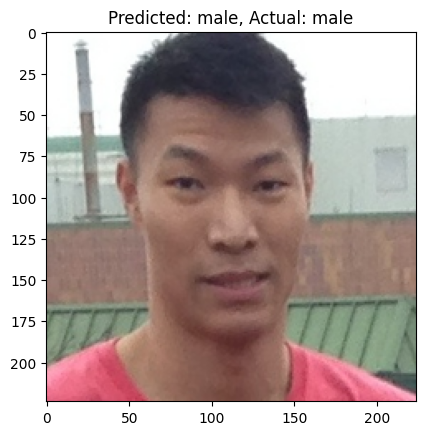

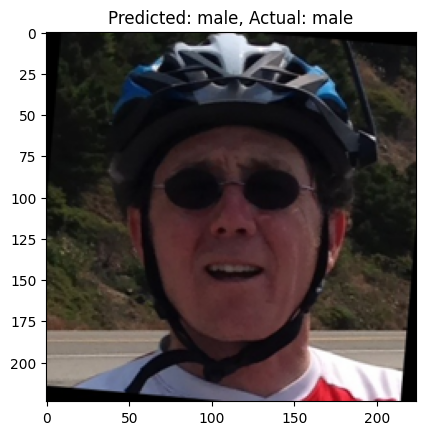

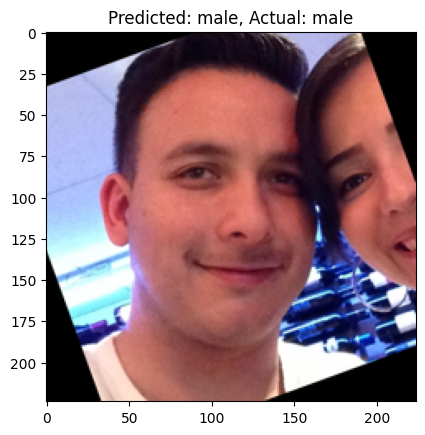

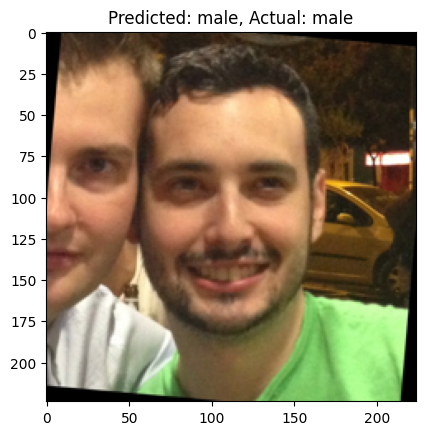

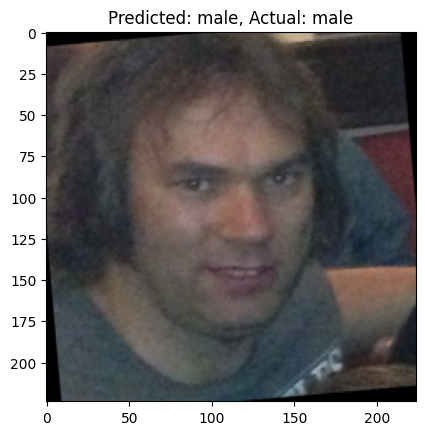

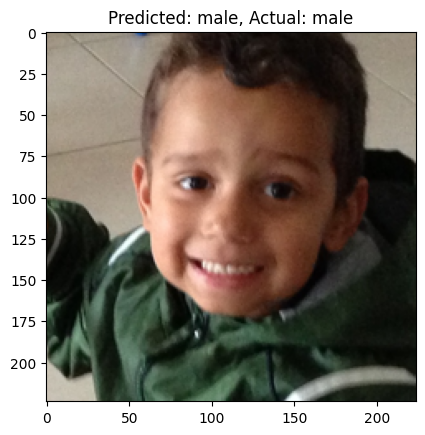

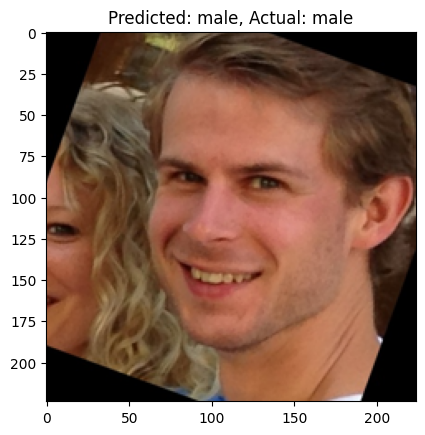

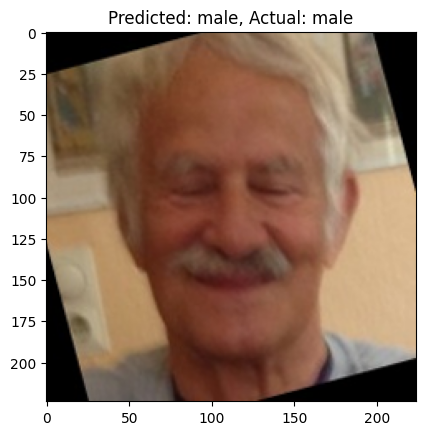

In [32]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()